In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import hvplot.pandas
from scipy import stats
from mlxtend.evaluate import bias_variance_decomp

%matplotlib inline
sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")

# Exploratory Data Analysis 

In [2]:
data = pd.read_csv("C:/Users/Rshs/Documents/python notebooks/mldatasets/heart.csv")
data.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        303 non-null    int64  
 12  thal      303 non-null    int64  
 13  target    303 non-null    int64  
dtypes: float64(1), int64(13)
memory usage: 33.3 KB


In [4]:
data.shape

(303, 14)

In [5]:
data.dtypes

age           int64
sex           int64
cp            int64
trestbps      int64
chol          int64
fbs           int64
restecg       int64
thalach       int64
exang         int64
oldpeak     float64
slope         int64
ca            int64
thal          int64
target        int64
dtype: object

In [6]:
pd.set_option("display.float", "{:.2f}".format)
data.describe().T

,count,mean,std,min,25%,50%,75%,max
age,303.00,54.37,9.08,29.00,47.50,55.00,61.00,77.00
sex,303.00,0.68,0.47,0.00,0.00,1.00,1.00,1.00
cp,303.00,0.97,1.03,0.00,0.00,1.00,2.00,3.00
trestbps,303.00,131.62,17.54,94.00,120.00,130.00,140.00,200.00
chol,303.00,246.26,51.83,126.00,211.00,240.00,274.50,564.00
fbs,303.00,0.15,0.36,0.00,0.00,0.00,0.00,1.00
restecg,303.00,0.53,0.53,0.00,0.00,1.00,1.00,2.00
thalach,303.00,149.65,22.91,71.00,133.50,153.00,166.00,202.00
exang,303.00,0.33,0.47,0.00,0.00,0.00,1.00,1.00
oldpeak,303.00,1.04,1.16,0.00,0.00,0.80,1.60,6.20


In [7]:
data['target'].nunique()

2

In [8]:
data.target.value_counts()

1    165
0    138
Name: target, dtype: int64

In [9]:
# Checking for messing values
data.isna().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
target      0
dtype: int64

In [10]:
data.groupby('sex')['target'].value_counts()


sex  target
0    1          72
     0          24
1    0         114
     1          93
Name: target, dtype: int64

In [11]:
have_disease = data.loc[data['target']==1, 'sex'].value_counts().hvplot.bar(alpha=0.4) 
no_disease = data.loc[data['target']==0, 'sex'].value_counts().hvplot.bar(alpha=0.4) 

(no_disease * have_disease).opts(
    title="Heart Disease by Sex", xlabel='Sex', ylabel='Count',
    width=500, height=450, legend_cols=2, legend_position='top_right'
)

:Overlay
   .Bars.Sex.I  :Bars   [index]   (sex)
   .Bars.Sex.II :Bars   [index]   (sex)

In [12]:
have_disease = data.loc[data['target']==1, 'cp'].value_counts().hvplot.bar(alpha=0.4) 
no_disease = data.loc[data['target']==0, 'cp'].value_counts().hvplot.bar(alpha=0.4) 

(no_disease * have_disease).opts(
    title="Heart Disease by Chest Pain Type", xlabel='Chest Pain Type', ylabel='Count',
    width=500, height=450, legend_cols=2, legend_position='top_right'
)

:Overlay
   .Bars.Cp.I  :Bars   [index]   (cp)
   .Bars.Cp.II :Bars   [index]   (cp)

In [3]:
categorical_val = []
continous_val = []
for column in data.columns:
    if len(data[column].unique()) <= 10:
        categorical_val.append(column)
    else:
        continous_val.append(column)

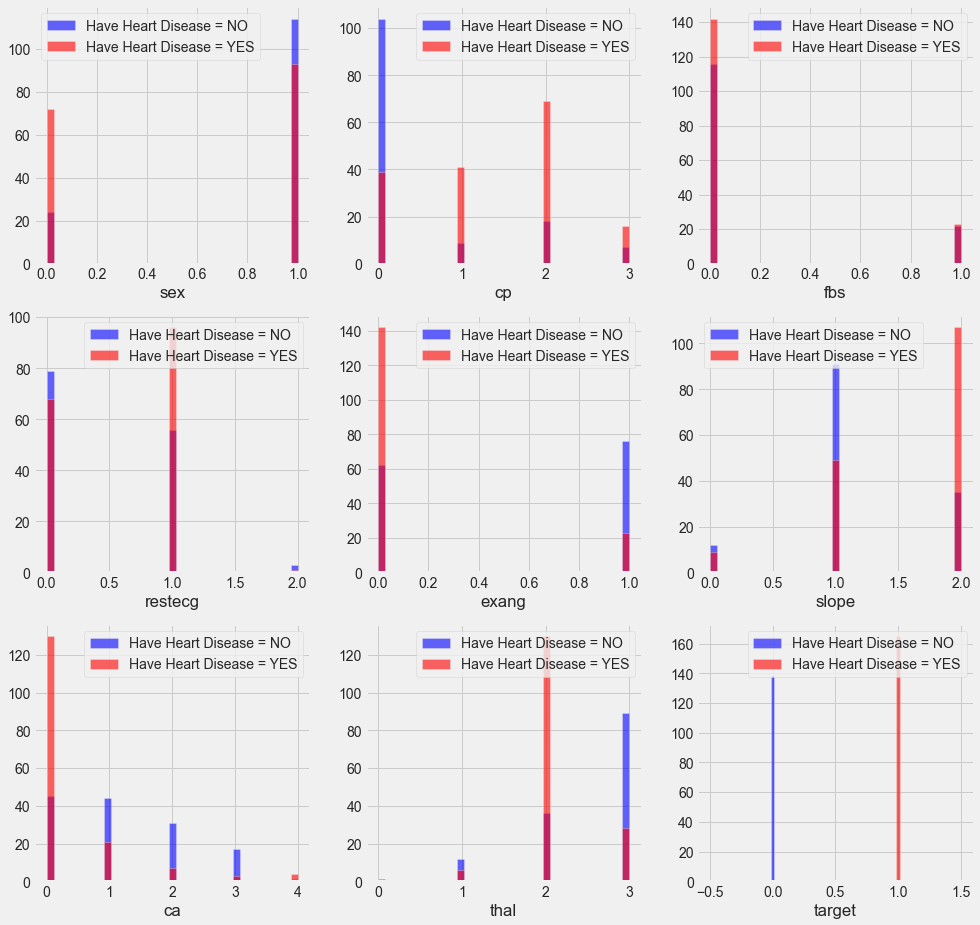

In [14]:
plt.figure(figsize=(15, 15))

for i, column in enumerate(categorical_val, 1):
    plt.subplot(3, 3, i)
    data[data["target"] == 0][column].hist(bins=35, color='blue', label='Have Heart Disease = NO', alpha=0.6)
    data[data["target"] == 1][column].hist(bins=35, color='red', label='Have Heart Disease = YES', alpha=0.6)
    plt.legend()
    plt.xlabel(column)

In [15]:
categorical_val

['sex', 'cp', 'fbs', 'restecg', 'exang', 'slope', 'ca', 'thal', 'target']

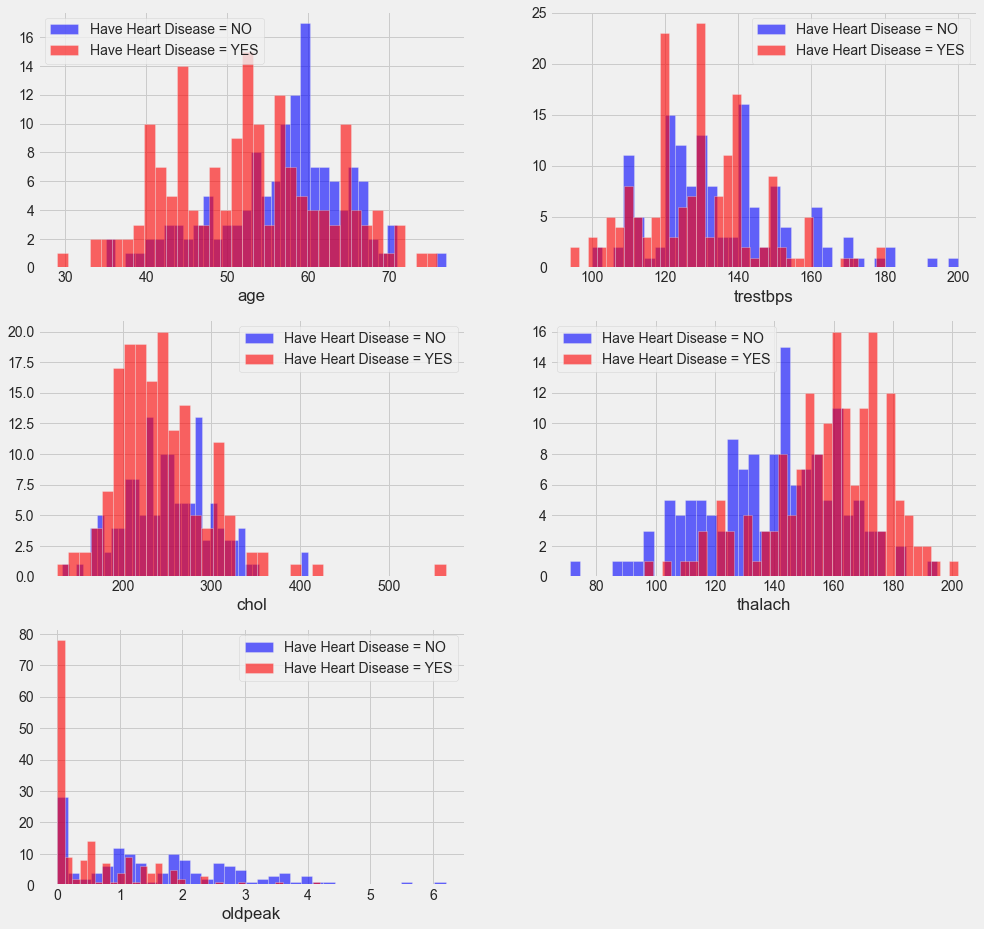

In [16]:
plt.figure(figsize=(15, 15))

for i, column in enumerate(continous_val, 1):
    plt.subplot(3, 2, i)
    data[data["target"] == 0][column].hist(bins=35, color='blue', label='Have Heart Disease = NO', alpha=0.6)
    data[data["target"] == 1][column].hist(bins=35, color='red', label='Have Heart Disease = YES', alpha=0.6)
    plt.legend()
    plt.xlabel(column)

trestbps : resting blood pressure (in mm Hg on admission to the hospital) anything above 130-140 is typically cause for concern
chol {serum cholestoral in mg/dl} : above 200 is cause for concern.
thalach {maximum heart rate achieved} : People how acheived a maximum more than 140 are more likely to have heart disease.
oldpeak ST depression induced by exercise relative to rest looks at stress of heart during excercise unhealthy heart will stress more

# Bivariate Analysis

In [17]:
correlation = data.corr()
correlation['target'].sort_values(ascending=False)

target      1.00
cp          0.43
thalach     0.42
slope       0.35
restecg     0.14
fbs        -0.03
chol       -0.09
trestbps   -0.14
age        -0.23
sex        -0.28
thal       -0.34
ca         -0.39
oldpeak    -0.43
exang      -0.44
Name: target, dtype: float64

In [18]:
data.drop('target', axis=1).corrwith(data.target).hvplot.barh(
    width=600, height=400, 
    title="Correlation between Heart Disease and Numeric Features", 
    ylabel='Correlation', xlabel='Numerical Features',
)

:Bars   [index]   (0)

### Findings 

-> The correlation coefficient ranges from -1 to +1.

-> When it is close to +1, this signifies that there is a strong positive correlation. So, we can see that there is no variable which has strong positive correlation with target variable.

-> When it is clsoe to -1, it means that there is a strong negative correlation. So, we can see that there is no variable which has strong negative correlation with target variable.

-> When it is close to 0, it means that there is very low correlation. So, there is very low correlation between target and fbs.

-> We can see that the cp and thalach variables are mildly positively correlated with target variable. So, I will analyze the interaction between these features and target variable.

## Analysis of target and cp variable 

In [19]:
data['cp'].nunique()

4

In [20]:
data['cp'].value_counts()

0    143
2     87
1     50
3     23
Name: cp, dtype: int64

In [21]:
data.groupby('cp')['target'].value_counts()

cp  target
0   0         104
    1          39
1   1          41
    0           9
2   1          69
    0          18
3   1          16
    0           7
Name: target, dtype: int64

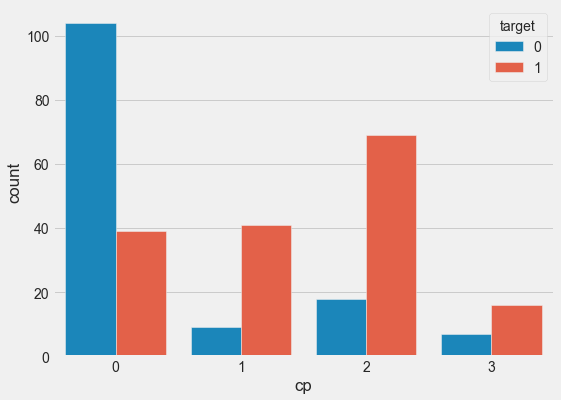

In [22]:
f, ax = plt.subplots(figsize=(8, 6))
ax = sns.countplot(x="cp", hue="target", data=data)
plt.show()

## Analysis of target and thalach variable

In [23]:
data['thalach'].nunique()

91

C:\Users\Rshs\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


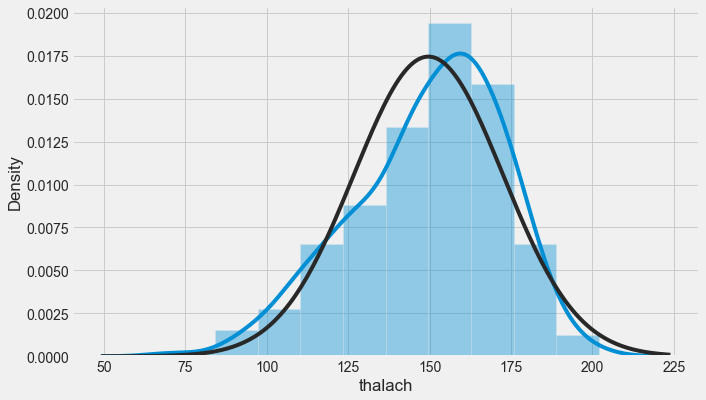

In [24]:
from scipy import stats
f, ax = plt.subplots(figsize=(10,6))
x = data['thalach']
ax = sns.distplot(x, bins=10,fit=stats.norm)
plt.show()

We can see that the thalach variable is slightly negatively skewed.

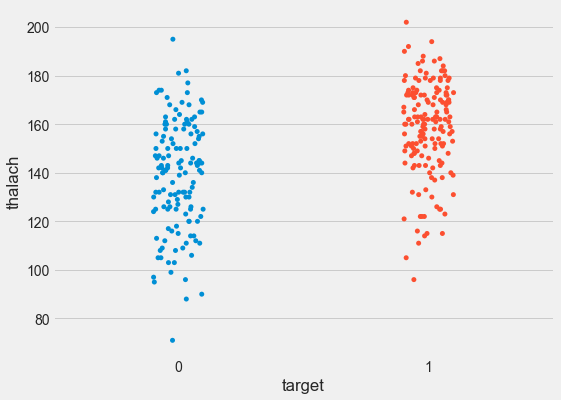

In [25]:
f, ax = plt.subplots(figsize=(8, 6))
sns.stripplot(x="target", y="thalach", data=data)
plt.show()

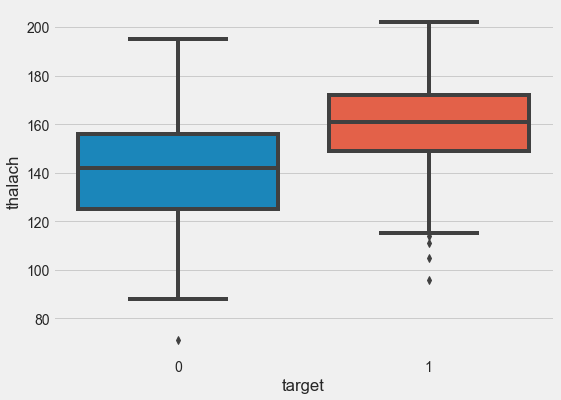

In [26]:
f, ax = plt.subplots(figsize=(8, 6))
sns.boxplot(x="target", y="thalach", data=data)
plt.show()

We can see that those people suffering from heart disease (target = 1) have relatively higher heart rate (thalach) as compared to people who are not suffering from heart disease (target = 0).

## Findings

-> There is no variable which has strong positive correlation with target variable.

-> There is no variable which has strong negative correlation with target variable.

-> There is very low correlation between target and fbs.

-> The cp and thalach variables are mildly positively correlated with target variable.

-> We can see that the thalach variable is slightly negatively skewed.

-> The people suffering from heart disease (target = 1) have relatively higher heart rate (thalach) as compared to people who are not suffering from heart disease (target = 0).

-> The people suffering from heart disease (target = 1) have relatively higher heart rate (thalach) as compared to people who are not suffering from heart disease (target = 0)

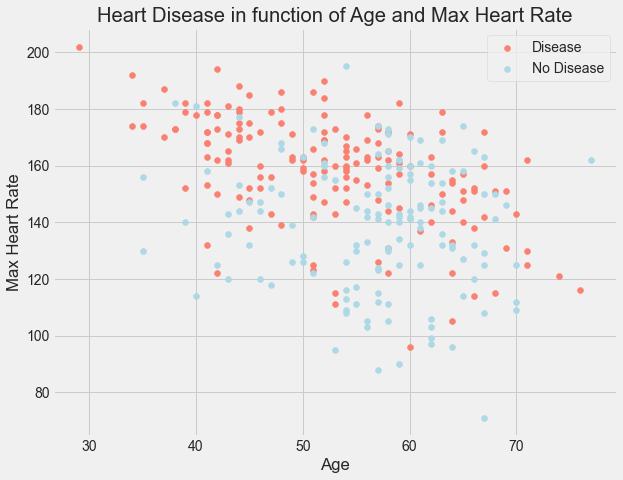

In [27]:
# Create another figure
plt.figure(figsize=(9, 7))

# Scatter with postivie examples
plt.scatter(data.age[data.target==1],
            data.thalach[data.target==1],
            c="salmon")

# Scatter with negative examples
plt.scatter(data.age[data.target==0],
            data.thalach[data.target==0],
            c="lightblue")

# Add some helpful info
plt.title("Heart Disease in function of Age and Max Heart Rate")
plt.xlabel("Age")
plt.ylabel("Max Heart Rate")
plt.legend(["Disease", "No Disease"]);

# Multivariate Analysis

## Heatmap

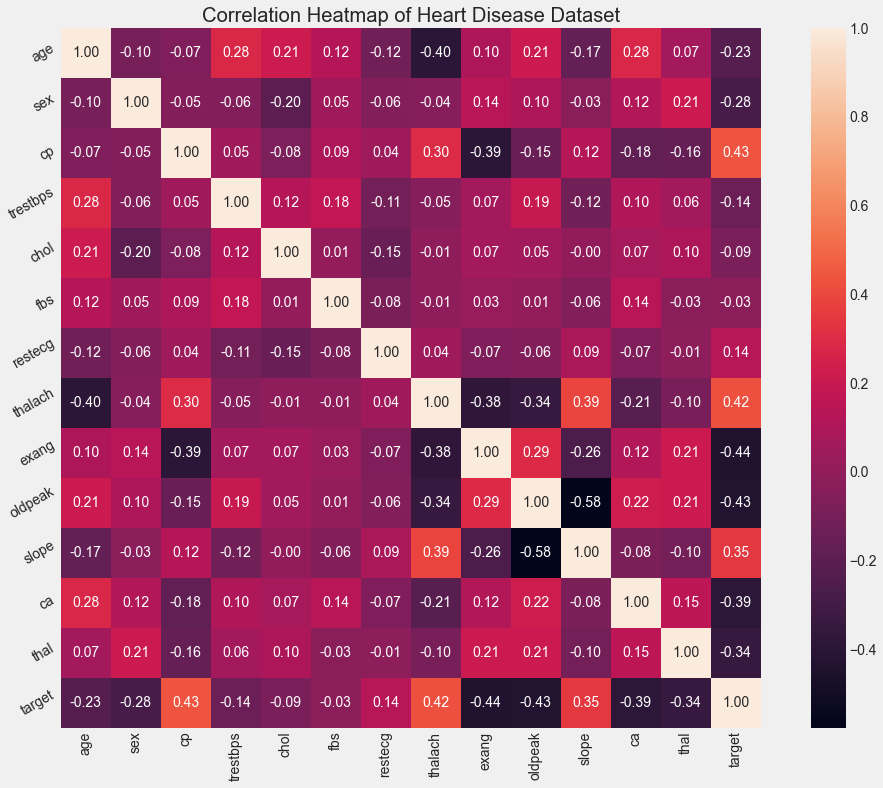

In [28]:
plt.figure(figsize=(16,12))
plt.title('Correlation Heatmap of Heart Disease Dataset')
a = sns.heatmap(correlation, square=True, annot=True, fmt='.2f', linecolor='white')
a.set_xticklabels(a.get_xticklabels(), rotation=90)
a.set_yticklabels(a.get_yticklabels(), rotation=30)           
plt.show()

## Findings

-> target and cp variable are mildly positively correlated (correlation coefficient = 0.43).

-> target and thalach variable are also mildly positively correlated (correlation coefficient = 0.42).

-> target and slope variable are weakly positively correlated (correlation coefficient = 0.35).

-> target and exang variable are mildly negatively correlated (correlation coefficient = -0.44).

-> target and oldpeak variable are also mildly negatively correlated (correlation coefficient = -0.43).

-> target and ca variable are weakly negatively correlated (correlation coefficient = -0.39).

-> target and thal variable are also waekly negatively correlated (correlation coefficient = -0.34).



## Analysis of Variables

### Age

In [29]:
data['age'].nunique()

41

In [30]:
data['age'].describe()

count   303.00
mean     54.37
std       9.08
min      29.00
25%      47.50
50%      55.00
75%      61.00
max      77.00
Name: age, dtype: float64

C:\Users\Rshs\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


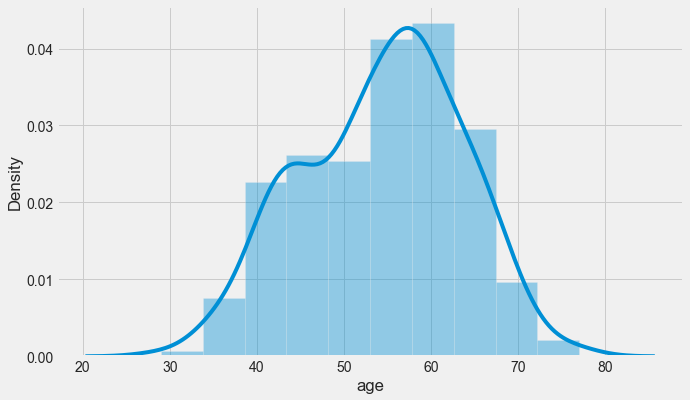

In [31]:
f, ax = plt.subplots(figsize=(10,6))
x = data['age']
ax = sns.distplot(x, bins=10)
plt.show()

it seems to be normal distribution (approximately)

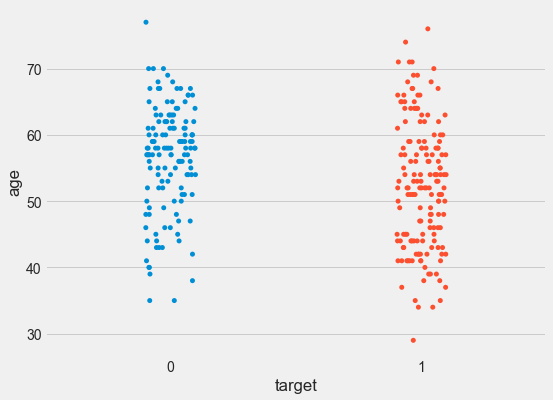

In [32]:
f, ax = plt.subplots(figsize=(8, 6))
sns.stripplot(x="target", y="age", data=data)
plt.show()

We can see that the people suffering from heart disease (target = 1) and people who are not suffering from heart disease (target = 0) have comparable ages.

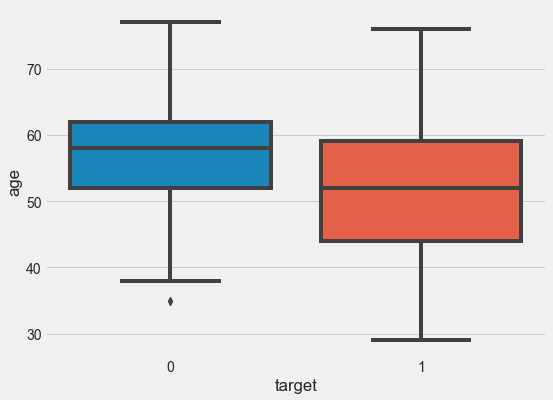

In [33]:
f, ax = plt.subplots(figsize=(8, 6))
sns.boxplot(x="target", y="age", data=data)
plt.show()

-> The mean age of the people who have heart disease is less than the mean age of the people who do not have heart disease.

-> The dispersion or spread of age of the people who have heart disease is greater than the dispersion or spread of age of the people who do not have heart disease.

### Age vs Trestbps

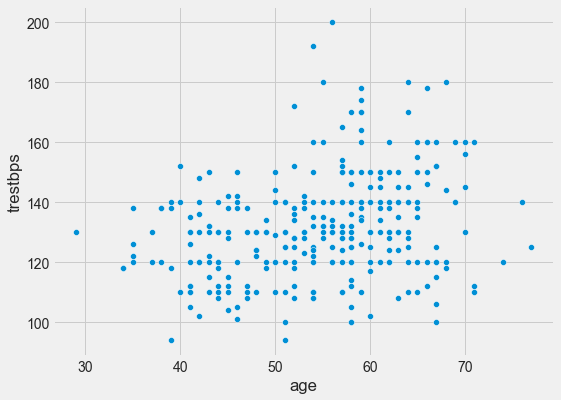

In [34]:
f, ax = plt.subplots(figsize=(8, 6))
ax = sns.scatterplot(x="age", y="trestbps", data=data)
plt.show()


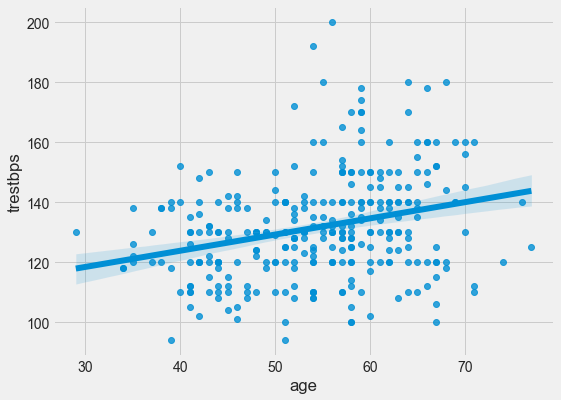

In [35]:
f, ax = plt.subplots(figsize=(8, 6))
ax = sns.regplot(x="age", y="trestbps", data=data)
plt.show()

### Age vs Chol

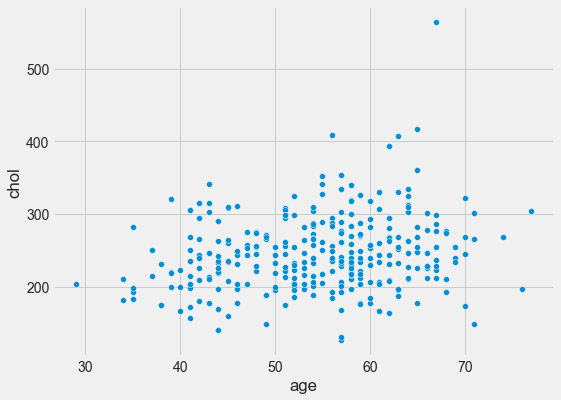

In [36]:
f, ax = plt.subplots(figsize=(8, 6))
ax = sns.scatterplot(x="age", y="chol", data=data)
plt.show()

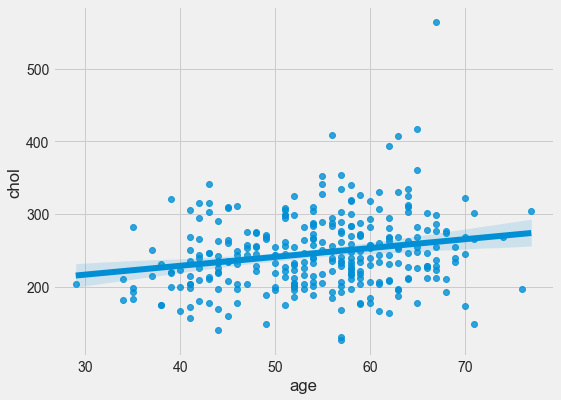

In [37]:
f, ax = plt.subplots(figsize=(8, 6))
ax = sns.regplot(x="age", y="chol", data=data)
plt.show()

## Chol and Thalach

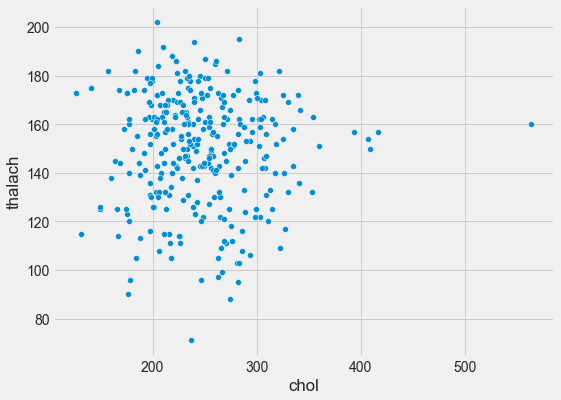

In [38]:
f, ax = plt.subplots(figsize=(8, 6))
ax = sns.scatterplot(x="chol", y = "thalach", data=data)
plt.show()

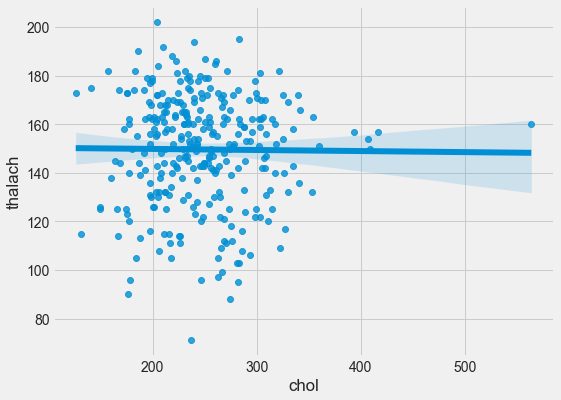

In [39]:
f, ax = plt.subplots(figsize=(8, 6))
ax = sns.regplot(x="chol", y="thalach", data=data)
plt.show()

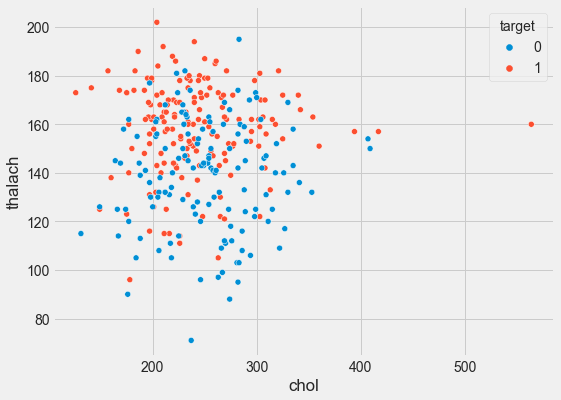

In [40]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='chol',y='thalach',data=data,hue='target')
plt.show()

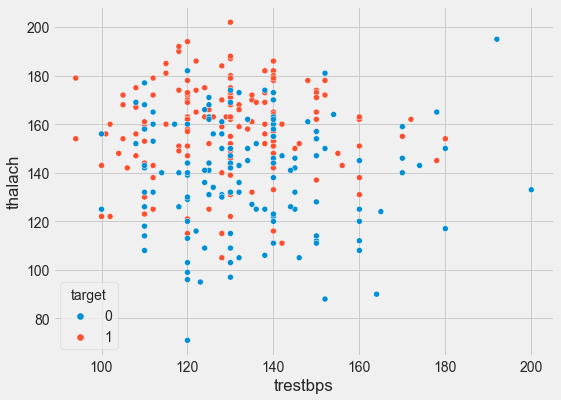

In [41]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='trestbps',y='thalach',data=data,hue='target')
plt.show()

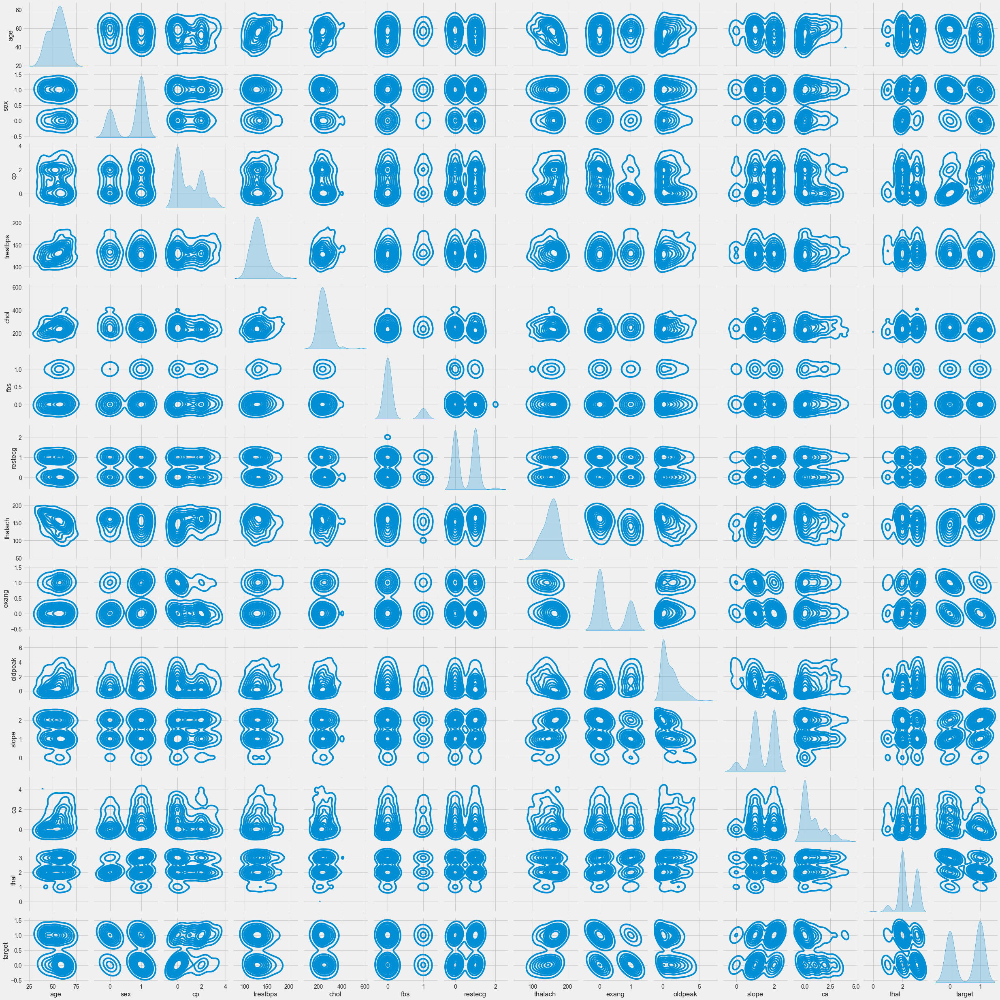

In [42]:
sns.pairplot(data,kind= 'kde')

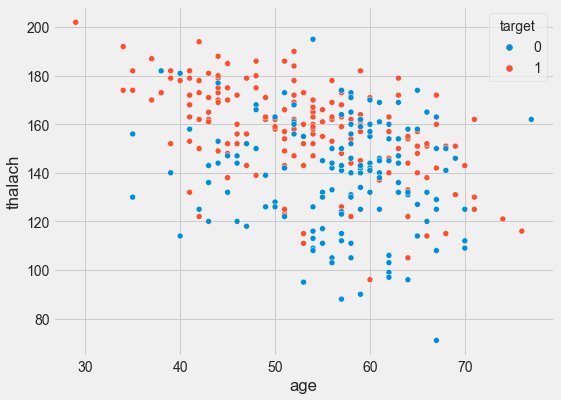

In [43]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='age',y='thalach',data=data,hue='target')
plt.show()

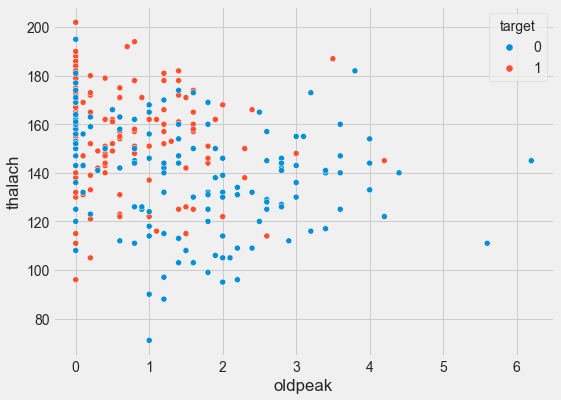

In [44]:
plt.figure(figsize=(8,6))
sns.scatterplot(x='oldpeak',y='thalach',data=data,hue='target')
plt.show()

# Outliers

<AxesSubplot:ylabel='chol'>

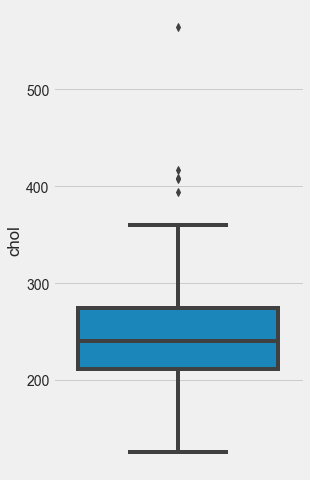

In [45]:
plt.figure(figsize = (4,8))
sns.boxplot(y = data.chol)

In [46]:
def out_iqr(df , column):
    global lower,upper
    q25, q75 = np.quantile(df[column], 0.25), np.quantile(df[column], 0.75)
    iqr = q75 - q25
    cut_off = iqr * 1.5
    lower, upper = q25 - cut_off, q75 + cut_off 
    print('The IQR is',iqr)
    print('The lower bound value is', lower)
    print('The upper bound value is', upper)
    df1 = df[df[column] > upper]
    df2 = df[df[column] < lower]
    return print('Total number of outliers are', df1.shape[0]+ df2.shape[0])

In [47]:
out_iqr(data,'chol')

The IQR is 63.5
The lower bound value is 115.75
The upper bound value is 369.75
Total number of outliers are 5


In [48]:
out_iqr(data,'age')

The IQR is 13.5
The lower bound value is 27.25
The upper bound value is 81.25
Total number of outliers are 0


In [49]:
out_iqr(data,'trestbps')

The IQR is 20.0
The lower bound value is 90.0
The upper bound value is 170.0
Total number of outliers are 9


In [50]:
out_iqr(data,'thalach')

The IQR is 32.5
The lower bound value is 84.75
The upper bound value is 214.75
Total number of outliers are 1


In [51]:
out_iqr(data,'oldpeak')

The IQR is 1.6
The lower bound value is -2.4000000000000004
The upper bound value is 4.0
Total number of outliers are 5


In [52]:
#Outlier Detection

from collections import Counter
def detect_outliers(df,n,features):
    outlier_indices = []
    for col in features:
        Q1 = np.percentile(df[col], 25)
        Q3 = np.percentile(df[col],75)
        IQR = Q3 - Q1
        outlier_step = 1.5 * IQR

        outlier_list_col = df[(df[col] < Q1 - outlier_step) | (df[col] > Q3 + outlier_step )].index
        
        outlier_indices.extend(outlier_list_col)
        
    outlier_indices = Counter(outlier_indices)        
    multiple_outliers = list( k for k, v in outlier_indices.items() if v > n )
    
    return multiple_outliers   

Outliers_to_drop = detect_outliers(data,1,['trestbps', 'chol','thalach','oldpeak'])

In [53]:
data.loc[Outliers_to_drop]

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
101,59,1,3,178,270,0,0,145,0,4.20,0,0,3,1


# Preprocessing

In [4]:
categorical_val.remove('target')
dataset = pd.get_dummies(data, columns = categorical_val)

In [55]:
dataset.head()

,age,trestbps,chol,thalach,oldpeak,target,sex_0,sex_1,cp_0,cp_1,...,slope_2,ca_0,ca_1,ca_2,ca_3,ca_4,thal_0,thal_1,thal_2,thal_3
0,63,145,233,150,2.30,1,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
1,37,130,250,187,3.50,1,0,1,0,0,...,0,1,0,0,0,0,0,0,1,0
2,41,130,204,172,1.40,1,1,0,0,1,...,1,1,0,0,0,0,0,0,1,0
3,56,120,236,178,0.80,1,0,1,0,1,...,1,1,0,0,0,0,0,0,1,0
4,57,120,354,163,0.60,1,1,0,1,0,...,1,1,0,0,0,0,0,0,1,0


In [5]:
print(data.columns)#before one hot
print(dataset.columns)#after one hot

Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach',
       'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target'],
      dtype='object')
Index(['age', 'trestbps', 'chol', 'thalach', 'oldpeak', 'target', 'sex_0',
       'sex_1', 'cp_0', 'cp_1', 'cp_2', 'cp_3', 'fbs_0', 'fbs_1', 'restecg_0',
       'restecg_1', 'restecg_2', 'exang_0', 'exang_1', 'slope_0', 'slope_1',
       'slope_2', 'ca_0', 'ca_1', 'ca_2', 'ca_3', 'ca_4', 'thal_0', 'thal_1',
       'thal_2', 'thal_3'],
      dtype='object')


In [5]:
from sklearn.preprocessing import StandardScaler

s_sc = StandardScaler()
col_to_scale = ['age', 'trestbps', 'chol', 'thalach', 'oldpeak']
dataset[col_to_scale] = s_sc.fit_transform(dataset[col_to_scale])

In [9]:
dataset.head()

,age,trestbps,chol,thalach,oldpeak,target,sex_0,sex_1,cp_0,cp_1,...,slope_2,ca_0,ca_1,ca_2,ca_3,ca_4,thal_0,thal_1,thal_2,thal_3
0,0.952197,0.763956,-0.256334,0.015443,1.087338,1,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
1,-1.915313,-0.092738,0.072199,1.633471,2.122573,1,0,1,0,0,...,0,1,0,0,0,0,0,0,1,0
2,-1.474158,-0.092738,-0.816773,0.977514,0.310912,1,1,0,0,1,...,1,1,0,0,0,0,0,0,1,0
3,0.180175,-0.663867,-0.198357,1.239897,-0.206705,1,0,1,0,1,...,1,1,0,0,0,0,0,0,1,0
4,0.290464,-0.663867,2.082050,0.583939,-0.379244,1,1,0,1,0,...,1,1,0,0,0,0,0,0,1,0


In [6]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, mean_absolute_error

def print_score(clf, X_test, y_test,X_train,y_train):
    pred = clf.predict(X_test)
    clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
    print("Test Result:\n================================================")        
    print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
    print("_______________________________________________")
    print(f"Mean Absolute Error: {mean_absolute_error(y_test, pred) }")
    print("_______________________________________________")
    print(f"CLASSIFICATION REPORT:\n")
    print(classification_report(y_test, pred))
    print("_______________________________________________")
    cf_matrix = confusion_matrix(y_test, pred)
    print(f"Confusion Matrix: \n {cf_matrix}\n")
    total=sum(sum(cf_matrix))
    sensitivity = cf_matrix[0,0]/(cf_matrix[0,0]+cf_matrix[1,0])
    print('Sensitivity : ', sensitivity )
    specificity = cf_matrix[1,1]/(cf_matrix[1,1]+cf_matrix[0,1])
    print('Specificity : ', specificity)
    print("Bias Variance Tradeoff")
    print("\n_______________________________________________\n")
    asl, bias, var = bias_variance_decomp(clf, X_train.values, y_train.values, X_test.values, y_test.values, loss='mse', num_rounds=200, random_seed=1)
    print('Average Expected Loss: %.3f' % asl)
    print('Bias: %.3f' % bias)
    print('Variance: %.3f' % var)

In [7]:
from sklearn.model_selection import train_test_split

X = dataset.drop('target', axis=1)
y = dataset.target

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model Training

## Logistic Regression

In [8]:
from sklearn.linear_model import LogisticRegression

lr_clf = LogisticRegression(solver='liblinear')
lr_clf.fit(X_train, y_train)

print_score(lr_clf, X_test, y_test,X_train,y_train)

Test Result:
Accuracy Score: 88.52%
_______________________________________________
Mean Absolute Error: 0.11475409836065574
_______________________________________________
CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.87      0.90      0.88        29
           1       0.90      0.88      0.89        32

    accuracy                           0.89        61
   macro avg       0.88      0.89      0.89        61
weighted avg       0.89      0.89      0.89        61

_______________________________________________
Confusion Matrix: 
 [[26  3]
 [ 4 28]]

Sensitivity :  0.8666666666666667
Specificity :  0.9032258064516129
Bias Variance Tradeoff

_______________________________________________

Average Expected Loss: 0.135
Bias: 0.096
Variance: 0.039


In [62]:
test_score = accuracy_score(y_test, lr_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, lr_clf.predict(X_train)) * 100

results_df = pd.DataFrame(data=[["Logistic Regression", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,87.60,88.52


## KNN classifier

In [12]:
from sklearn.neighbors import KNeighborsClassifier

knn_clf = KNeighborsClassifier()
knn_clf.fit(X_train, y_train)

print_score(knn_clf, X_test, y_test,X_train,y_train)

Test Result:
Accuracy Score: 90.16%
_______________________________________________
Mean Absolute Error: 0.09836065573770492
_______________________________________________
CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.90      0.90      0.90        29
           1       0.91      0.91      0.91        32

    accuracy                           0.90        61
   macro avg       0.90      0.90      0.90        61
weighted avg       0.90      0.90      0.90        61

_______________________________________________
Confusion Matrix: 
 [[26  3]
 [ 3 29]]

Sensitivity :  0.896551724137931
Specificity :  0.90625
_______________________________________________
Average Expected Loss: 0.132
Bias: 0.076
Variance: 0.056


In [64]:
test_score = accuracy_score(y_test, knn_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, knn_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["K-nearest neighbors", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,87.60,88.52
1,K-nearest neighbors,87.60,90.16


## Support Vector Machine 

In [13]:
from sklearn.svm import SVC


svm_clf = SVC(kernel='rbf', gamma=0.1, C=1.0)
svm_clf.fit(X_train, y_train)

print_score(svm_clf, X_test, y_test,X_train,y_train)

Test Result:
Accuracy Score: 90.16%
_______________________________________________
Mean Absolute Error: 0.09836065573770492
_______________________________________________
CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.87      0.93      0.90        29
           1       0.93      0.88      0.90        32

    accuracy                           0.90        61
   macro avg       0.90      0.90      0.90        61
weighted avg       0.90      0.90      0.90        61

_______________________________________________
Confusion Matrix: 
 [[27  2]
 [ 4 28]]

Sensitivity :  0.8709677419354839
Specificity :  0.9333333333333333
_______________________________________________
Average Expected Loss: 0.138
Bias: 0.102
Variance: 0.036


In [66]:
test_score = accuracy_score(y_test, svm_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, svm_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Support Vector Machine", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,87.60,88.52
1,K-nearest neighbors,87.60,90.16
2,Support Vector Machine,92.56,90.16


## Decision Tree Classifier

In [14]:
from sklearn.tree import DecisionTreeClassifier


tree_clf = DecisionTreeClassifier(random_state=42)
tree_clf.fit(X_train, y_train)

print_score(tree_clf, X_test, y_test,X_train,y_train)

Test Result:
Accuracy Score: 81.97%
_______________________________________________
Mean Absolute Error: 0.18032786885245902
_______________________________________________
CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.78      0.86      0.82        29
           1       0.86      0.78      0.82        32

    accuracy                           0.82        61
   macro avg       0.82      0.82      0.82        61
weighted avg       0.82      0.82      0.82        61

_______________________________________________
Confusion Matrix: 
 [[25  4]
 [ 7 25]]

Sensitivity :  0.78125
Specificity :  0.8620689655172413
_______________________________________________
Average Expected Loss: 0.240
Bias: 0.112
Variance: 0.127


In [68]:
test_score = accuracy_score(y_test, tree_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, tree_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Decision Tree Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,87.60,88.52
1,K-nearest neighbors,87.60,90.16
2,Support Vector Machine,92.56,90.16
3,Decision Tree Classifier,100.00,81.97


## Random Forest classifier

In [15]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

rf_clf = RandomForestClassifier(n_estimators=1000, random_state=42)
rf_clf.fit(X_train, y_train)

print_score(rf_clf, X_test, y_test,X_train,y_train)

Test Result:
Accuracy Score: 85.25%
_______________________________________________
Mean Absolute Error: 0.14754098360655737
_______________________________________________
CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.83      0.86      0.85        29
           1       0.87      0.84      0.86        32

    accuracy                           0.85        61
   macro avg       0.85      0.85      0.85        61
weighted avg       0.85      0.85      0.85        61

_______________________________________________
Confusion Matrix: 
 [[25  4]
 [ 5 27]]

Sensitivity :  0.8333333333333334
Specificity :  0.8709677419354839
_______________________________________________
Average Expected Loss: 0.145
Bias: 0.113
Variance: 0.032


In [70]:
test_score = accuracy_score(y_test, rf_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, rf_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Random Forest Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,87.60,88.52
1,K-nearest neighbors,87.60,90.16
2,Support Vector Machine,92.56,90.16
3,Decision Tree Classifier,100.00,81.97
4,Random Forest Classifier,100.00,85.25


## XGBoost Classifier

In [16]:
from xgboost import XGBClassifier

xgb_clf = XGBClassifier(use_label_encoder=False, verbosity = 0, silent=True)
xgb_clf.fit(X_train, y_train)

print_score(xgb_clf, X_test, y_test,X_train,y_train)

Test Result:
Accuracy Score: 83.61%
_______________________________________________
Mean Absolute Error: 0.16393442622950818
_______________________________________________
CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.79      0.90      0.84        29
           1       0.89      0.78      0.83        32

    accuracy                           0.84        61
   macro avg       0.84      0.84      0.84        61
weighted avg       0.84      0.84      0.84        61

_______________________________________________
Confusion Matrix: 
 [[26  3]
 [ 7 25]]

Sensitivity :  0.7878787878787878
Specificity :  0.8928571428571429
_______________________________________________
Average Expected Loss: 0.160
Bias: 0.109
Variance: 0.051


In [72]:
test_score = accuracy_score(y_test, xgb_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, xgb_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["XGBoost Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df = results_df.append(results_df_2, ignore_index=True)
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,87.60,88.52
1,K-nearest neighbors,87.60,90.16
2,Support Vector Machine,92.56,90.16
3,Decision Tree Classifier,100.00,81.97
4,Random Forest Classifier,100.00,85.25
5,XGBoost Classifier,100.00,83.61


# Parameter Tuning

## Logistic Regression Hyper parameter Tuning

In [17]:
from sklearn.model_selection import GridSearchCV
params = {"C": np.logspace(-4, 4, 20),
          "solver": ["liblinear"]}
lr_clf = LogisticRegression()
lr_cv = GridSearchCV(lr_clf, params, scoring="accuracy", n_jobs=-1, verbose=1, cv=5)
lr_cv.fit(X_train, y_train)
best_params = lr_cv.best_params_
print(f"Best parameters: {best_params}")
lr_clf = LogisticRegression(**best_params)
lr_clf.fit(X_train, y_train)
print_score(lr_clf, X_test, y_test,X_train,y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters: {'C': 1438.44988828766, 'solver': 'liblinear'}
Test Result:
Accuracy Score: 85.25%
_______________________________________________
Mean Absolute Error: 0.14754098360655737
_______________________________________________
CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.86      0.83      0.84        29
           1       0.85      0.88      0.86        32

    accuracy                           0.85        61
   macro avg       0.85      0.85      0.85        61
weighted avg       0.85      0.85      0.85        61

_______________________________________________
Confusion Matrix: 
 [[24  5]
 [ 4 28]]

Sensitivity :  0.8571428571428571
Specificity :  0.8484848484848485
_______________________________________________
Average Expected Loss: 0.162
Bias: 0.106
Variance: 0.056


In [74]:
test_score = accuracy_score(y_test, lr_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, lr_clf.predict(X_train)) * 100

tuning_results_df = pd.DataFrame(data=[["Tuned Logistic Regression", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,88.02,85.25


## KNN Hyper parameter tuning

In [75]:
train_score = []
test_score = []
neighbors = range(1, 30)
bst_n = 0
for k in neighbors:
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train, y_train)
    test_score.append(accuracy_score(y_test, model.predict(X_test)))     

Maximum KNN score on the test data: 91.80%


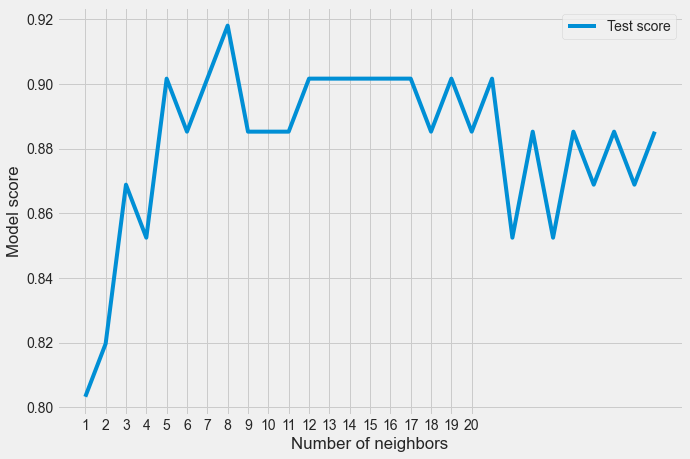

In [76]:
plt.figure(figsize=(10, 7))
plt.plot(neighbors, test_score, label="Test score")
plt.xticks(np.arange(1, 21, 1))
plt.xlabel("Number of neighbors")
plt.ylabel("Model score")
plt.legend()
print(f"Maximum KNN score on the test data: {max(test_score)*100:.2f}%")

In [18]:
knn_clf = KNeighborsClassifier(n_neighbors=8)
knn_clf.fit(X_train, y_train)

print_score(knn_clf, X_test, y_test,X_train,y_train)

Test Result:
Accuracy Score: 91.80%
_______________________________________________
Mean Absolute Error: 0.08196721311475409
_______________________________________________
CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.90      0.93      0.92        29
           1       0.94      0.91      0.92        32

    accuracy                           0.92        61
   macro avg       0.92      0.92      0.92        61
weighted avg       0.92      0.92      0.92        61

_______________________________________________
Confusion Matrix: 
 [[27  2]
 [ 3 29]]

Sensitivity :  0.9
Specificity :  0.9354838709677419
_______________________________________________
Average Expected Loss: 0.134
Bias: 0.087
Variance: 0.048


In [78]:
test_score = accuracy_score(y_test, knn_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, knn_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned K-nearest neighbors", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,88.02,85.25
1,Tuned K-nearest neighbors,85.95,91.80


## Support Vector Machine Hyper parameter Tuning

In [19]:
svm_clf = SVC(kernel='rbf', gamma=0.1, C=1.0)
params = {"C":(0.1, 0.5, 1, 2, 5, 10, 20), "gamma":(0.001, 0.01, 0.1, 0.25, 0.5, 0.75, 1), "kernel":('linear', 'poly', 'rbf')}
svm_cv = GridSearchCV(svm_clf, params, n_jobs=-1, cv=5, verbose=1, scoring="accuracy")
svm_cv.fit(X_train, y_train)
best_params = svm_cv.best_params_
print(f"Best params: {best_params}")
svm_clf = SVC(**best_params)
svm_clf.fit(X_train, y_train)
print_score(svm_clf, X_test, y_test,X_train,y_train)

Fitting 5 folds for each of 147 candidates, totalling 735 fits
Best params: {'C': 2, 'gamma': 0.1, 'kernel': 'rbf'}
Test Result:
Accuracy Score: 86.89%
_______________________________________________
Mean Absolute Error: 0.13114754098360656
_______________________________________________
CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.86      0.86      0.86        29
           1       0.88      0.88      0.88        32

    accuracy                           0.87        61
   macro avg       0.87      0.87      0.87        61
weighted avg       0.87      0.87      0.87        61

_______________________________________________
Confusion Matrix: 
 [[25  4]
 [ 4 28]]

Sensitivity :  0.8620689655172413
Specificity :  0.875
_______________________________________________
Average Expected Loss: 0.151
Bias: 0.112
Variance: 0.039


In [80]:
test_score = accuracy_score(y_test, svm_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, svm_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned Support Vector Machine", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,88.02,85.25
1,Tuned K-nearest neighbors,85.95,91.80
2,Tuned Support Vector Machine,94.21,86.89


## Decision Tree Hyper parameter tuning

In [20]:
params = {"criterion":("gini", "entropy"), "splitter":("best", "random"), "max_depth":(list(range(1, 20))), "min_samples_split":[2, 3, 4], 
          "min_samples_leaf":list(range(1, 20))}
tree_clf = DecisionTreeClassifier(random_state=42)
tree_cv = GridSearchCV(tree_clf, params, scoring="accuracy", n_jobs=-1, verbose=1, cv=3)
tree_cv.fit(X_train, y_train)
best_params = tree_cv.best_params_
print(f'Best_params: {best_params}')
tree_clf = DecisionTreeClassifier(**best_params)
tree_clf.fit(X_train, y_train)
print_score(tree_clf, X_test, y_test,X_train,y_train)

Fitting 3 folds for each of 4332 candidates, totalling 12996 fits
Best_params: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_leaf': 9, 'min_samples_split': 2, 'splitter': 'random'}
Test Result:
Accuracy Score: 86.89%
_______________________________________________
Mean Absolute Error: 0.13114754098360656
_______________________________________________
CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.89      0.83      0.86        29
           1       0.85      0.91      0.88        32

    accuracy                           0.87        61
   macro avg       0.87      0.87      0.87        61
weighted avg       0.87      0.87      0.87        61

_______________________________________________
Confusion Matrix: 
 [[24  5]
 [ 3 29]]

Sensitivity :  0.8888888888888888
Specificity :  0.8529411764705882
_______________________________________________
Average Expected Loss: 0.176
Bias: 0.093
Variance: 0.082


In [82]:
test_score = accuracy_score(y_test, tree_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, tree_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned Decision Tree Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,88.02,85.25
1,Tuned K-nearest neighbors,85.95,91.80
2,Tuned Support Vector Machine,94.21,86.89
3,Tuned Decision Tree Classifier,84.71,86.89


## Random Forest CLassifier Hyper parameter tuning

In [21]:
n_estimators = [500, 900, 1100, 1500]
max_features = ['auto', 'sqrt']
max_depth = [2, 3, 5, 10, 15, None]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]

params_grid = {
    'n_estimators': n_estimators, 
    'max_features': max_features,
    'max_depth': max_depth, 
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf
              }

rf_clf = RandomForestClassifier(random_state=42)
rf_cv = GridSearchCV(rf_clf, params_grid, scoring="accuracy", cv=3, verbose=1, n_jobs=-1)
rf_cv.fit(X_train, y_train)
best_params = rf_cv.best_params_
print(f"Best parameters: {best_params}")

rf_clf = RandomForestClassifier(**best_params)
rf_clf.fit(X_train, y_train)

print_score(rf_clf, X_test, y_test,X_train,y_train)

Fitting 3 folds for each of 432 candidates, totalling 1296 fits
Best parameters: {'max_depth': 2, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1100}
Test Result:
Accuracy Score: 86.89%
_______________________________________________
Mean Absolute Error: 0.13114754098360656
_______________________________________________
CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.86      0.86      0.86        29
           1       0.88      0.88      0.88        32

    accuracy                           0.87        61
   macro avg       0.87      0.87      0.87        61
weighted avg       0.87      0.87      0.87        61

_______________________________________________
Confusion Matrix: 
 [[25  4]
 [ 4 28]]

Sensitivity :  0.8620689655172413
Specificity :  0.875
_______________________________________________
Average Expected Loss: 0.134
Bias: 0.106
Variance: 0.028


In [84]:
test_score = accuracy_score(y_test, rf_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, rf_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned Random Forest Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,88.02,85.25
1,Tuned K-nearest neighbors,85.95,91.80
2,Tuned Support Vector Machine,94.21,86.89
3,Tuned Decision Tree Classifier,84.71,86.89
4,Tuned Random Forest Classifier,84.71,86.89


## XGBoost Hyper parameter tuning

In [22]:
param_grid = dict(
    n_estimators=stats.randint(10, 1000),
    max_depth=stats.randint(1, 10),
    learning_rate=stats.uniform(0, 1)
)

xgb_clf = XGBClassifier(use_label_encoder=False, verbosity = 0, silent=True)
xgb_cv = RandomizedSearchCV(
    xgb_clf, param_grid, cv=3, n_iter=50, 
    scoring='accuracy', n_jobs=-1, verbose=1
)
xgb_cv.fit(X_train, y_train)
best_params = xgb_cv.best_params_
print(f"Best paramters: {best_params}")

xgb_clf = XGBClassifier(**best_params)
xgb_clf.fit(X_train, y_train)

print_score(xgb_clf, X_test, y_test,X_train,y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits
Best paramters: {'learning_rate': 0.3647355352977073, 'max_depth': 4, 'n_estimators': 197}
Test Result:
Accuracy Score: 85.25%
_______________________________________________
Mean Absolute Error: 0.14754098360655737
_______________________________________________
CLASSIFICATION REPORT:

              precision    recall  f1-score   support

           0       0.81      0.90      0.85        29
           1       0.90      0.81      0.85        32

    accuracy                           0.85        61
   macro avg       0.85      0.85      0.85        61
weighted avg       0.86      0.85      0.85        61

_______________________________________________
Confusion Matrix: 
 [[26  3]
 [ 6 26]]

Sensitivity :  0.8125
Specificity :  0.896551724137931
_______________________________________________


C:\Users\Rshs\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\Rshs\anaconda3\lib\site-packages\xgboost\sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


Average Expected Loss: 0.157
Bias: 0.108
Variance: 0.049


In [86]:
test_score = accuracy_score(y_test, xgb_clf.predict(X_test)) * 100
train_score = accuracy_score(y_train, xgb_clf.predict(X_train)) * 100

results_df_2 = pd.DataFrame(data=[["Tuned XGBoost Classifier", train_score, test_score]], 
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
tuning_results_df = tuning_results_df.append(results_df_2, ignore_index=True)
tuning_results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Tuned Logistic Regression,88.02,85.25
1,Tuned K-nearest neighbors,85.95,91.80
2,Tuned Support Vector Machine,94.21,86.89
3,Tuned Decision Tree Classifier,84.71,86.89
4,Tuned Random Forest Classifier,84.71,86.89
5,Tuned XGBoost Classifier,100.00,85.25


In [87]:
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,87.60,88.52
1,K-nearest neighbors,87.60,90.16
2,Support Vector Machine,92.56,90.16
3,Decision Tree Classifier,100.00,81.97
4,Random Forest Classifier,100.00,85.25
5,XGBoost Classifier,100.00,83.61


In [1]:
!pip install mlxtend